In [211]:
import torch
import torch.nn.functional as F
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import skimage.io as skio
import cv2
import skimage as sk
import skimage.io as skio
import os
import skimage.transform as skt
from skimage.transform import rescale
from scipy.ndimage import convolve


In [73]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

imname = 'data/cathedral.jpg'
# read in the image
im = skio.imread(imname)

# convert to double (might want to do this later on to save memory)    
image = sk.img_as_float(im)

height = image.shape[0] // 3

b = image[:height]
g = image[height:2*height]
r = image[2*height:3*height]

def l2_loss(a, b):
    return np.sum((a - b) ** 2)

def ncc_loss(x, y):
    # Flatten the images to 1D
    x_flat = x.flatten()
    y_flat = y.flatten()
    
    # Normalize the flattened vectors
    x_norm = x_flat / np.linalg.norm(x_flat)
    y_norm = y_flat / np.linalg.norm(y_flat)
    
    # Compute the dot product between the normalized vectors
    ncc = np.dot(x_norm, y_norm)
    
    return ncc

def align(img, reference, loss_fn, max_shift=15):
    best_shift = (0, 0)
    best_score = float('inf')

    for dx in range(-max_shift, max_shift + 1):
        for dy in range(-max_shift, max_shift + 1):
            shifted_img = np.roll(np.roll(img, dx, axis=0), dy, axis=1)
            
            score = loss_fn(shifted_img, reference)
            
            if score < best_score:
                best_score = score
                best_shift = (dx, dy)

    aligned_img = np.roll(np.roll(img, best_shift[0], axis=0), best_shift[1], axis=1)
    return aligned_img, best_shift, best_score


(341, 390, 3)


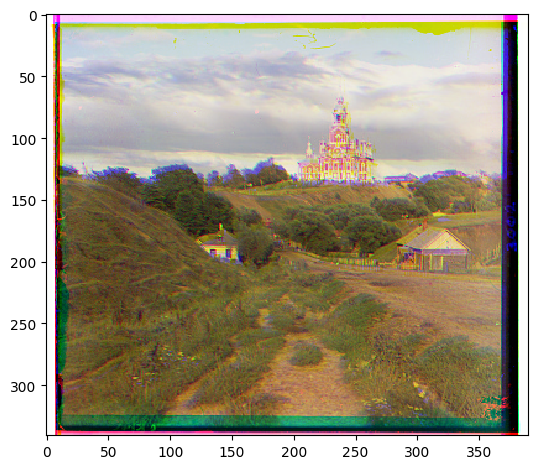

(1, -1) (7, -1) 4854.936747404845 7443.6468589004235


In [74]:
ag, shift1, loss1 = align(g, b, l2_loss)
ar, shift2, loss2 = align(r, b, l2_loss)

im_out = np.dstack([ar, ag, b])
im_out = (im_out * 255).astype(np.uint8) 
print(im_out.shape)

# save the image
fname = 'cathedral_l2.jpg'
skio.imsave(fname, im_out)

# display the image
skio.imshow(im_out)
skio.show()
print(shift1, shift2, loss1, loss2)

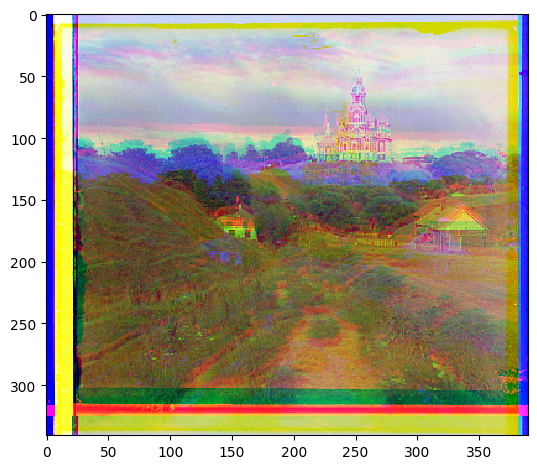

(-15, 14) (-15, 13) 0.8370950897545867 0.8173280992516421


In [75]:
ag, shift1, loss1 = align(g, b, ncc_loss)
ar, shift2, loss2 = align(r, b, ncc_loss)

im_out = np.dstack([ar, ag, b])
im_out = (im_out * 255).astype(np.uint8) 

# save the image
fname = 'cathedral_ncc.jpg'
skio.imsave(fname, im_out)

# display the image
skio.imshow(im_out)
skio.show()
print(shift1, shift2, loss1, loss2)

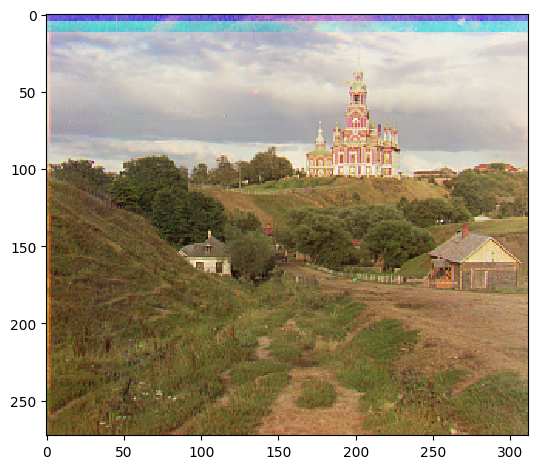

(5, 2) (12, 3) 11357.253622917038 22704.551590821204


In [83]:
def center_normalize(img):
    mean = np.mean(img)
    std = np.std(img)
    img_normalized = (img - mean) / std
    return img_normalized

def crop_edge(img, crop_percentage=0.1):
    height, width = img.shape[0], img.shape[1]
    crop_h = int(height * crop_percentage)
    crop_w = int(width * crop_percentage)
    cropped_img = img[crop_h:height-crop_h, crop_w:width-crop_w]
    return cropped_img

def modified_align(img, norm_img, norm_ref, loss_fn, max_shift=15):
    best_shift = (0, 0)
    best_score = float('inf')

    for dx in range(-max_shift, max_shift + 1):
        for dy in range(-max_shift, max_shift + 1):
            shifted_img = np.roll(np.roll(norm_img, dx, axis=0), dy, axis=1)
            score = loss_fn(shifted_img, norm_ref)
            
            if score < best_score:
                best_score = score
                best_shift = (dx, dy)

    aligned_img = np.roll(np.roll(img, best_shift[0], axis=0), best_shift[1], axis=1)
    return aligned_img, best_shift, best_score


new_g, new_b, new_r = crop_edge(center_normalize(g)), crop_edge(center_normalize(b)), crop_edge(center_normalize(r))
ag, shift1, loss1 = modified_align(crop_edge(g), new_g, new_b, l2_loss)
ar, shift2, loss2 = modified_align(crop_edge(r), new_r, new_b, l2_loss)

im_out = np.dstack([ar, ag, crop_edge(b)])
im_out = (im_out * 255).astype(np.uint8) 

# save the image
fname = 'cathedral_modified_l2.jpg'
skio.imsave(fname, im_out)

# display the image
skio.imshow(im_out)
skio.show()
print(shift1, shift2, loss1, loss2)

Processing monastery.jpg


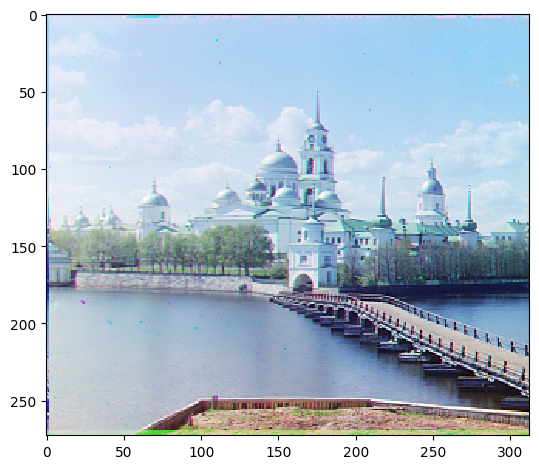

(-3, 2) (3, 2) 9647.093822823841 29008.916902607307
Finished processing monastery.jpg
Processing tobolsk.jpg


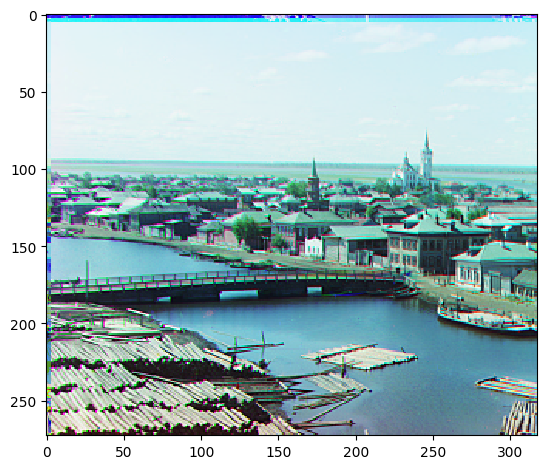

(3, 3) (6, 3) 15094.11860550242 25886.981356401073
Finished processing tobolsk.jpg
Processing cathedral.jpg


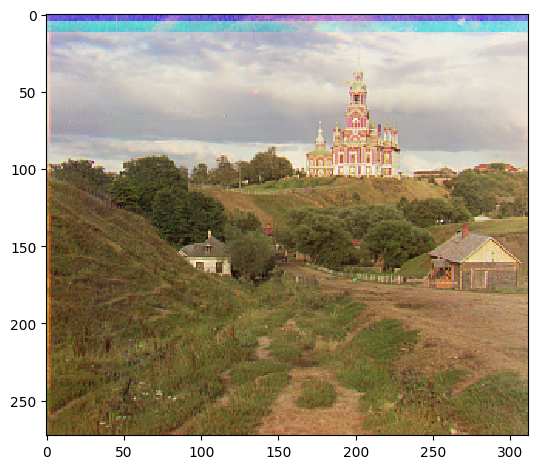

(5, 2) (12, 3) 11357.253622917038 22704.551590821204
Finished processing cathedral.jpg


In [93]:
for image_file in os.listdir("data"):
    image_path = os.path.join("data", image_file)
    if os.path.isfile(image_path) and image_file.lower().endswith(('.jpg')):
        print(f"Processing {image_file}")
        output_dir = f"output/{image_file}"
        image = skio.imread(image_path)
        image = sk.img_as_float(image)
        height = image.shape[0] // 3

        b = image[:height]
        g = image[height:2*height]
        r = image[2*height:3*height]

        new_g, new_b, new_r = crop_edge(center_normalize(g)), crop_edge(center_normalize(b)), crop_edge(center_normalize(r))
        ag, shift1, loss1 = modified_align(crop_edge(g), new_g, new_b, l2_loss)
        ar, shift2, loss2 = modified_align(crop_edge(r), new_r, new_b, l2_loss)
        
        im_out = np.dstack([ar, ag, crop_edge(b)])
        im_out = (im_out * 255).astype(np.uint8) 
        
        skio.imsave(image_file, im_out)
        
        # display the image
        skio.imshow(im_out)
        skio.show()

        print(shift1, shift2, loss1, loss2)
        
        print(f"Finished processing {image_file}")

In [217]:
def combine_and_save_image(r, g, b, output_path):
    im_out = np.dstack([r, g, b])
    im_out = (im_out * 255).astype(np.uint8) 
    skio.imsave(output_path, im_out)
    skio.imshow(im_out)
    skio.show()

def pyramid_align(im1, im2, loss_fn, use_edge=False, off_x=(-15, 15), off_y=(-15, 15)):
    best_score = -float('inf')
    best_shift = (0,0)

    for i in range(off_x[0], off_x[1] + 1):
        for j in range(off_y[0], off_y[1] + 1):
            temp_score = loss_fn(np.roll(im1, (i, j), (0, 1)), im2)
            if temp_score > best_score:
                best_score = temp_score
                best_shift = (i,j)
                
    return np.roll(im1, best_shift, (0, 1)), np.array(best_shift)

def pyramid(im1, im2, loss_fn, use_edge=False, off_x=(-4, 4), off_y=(-4, 4), depth=5):
    if im1.shape[0] < 400 or depth == 0:
        return pyramid_align(im1, im2, loss_fn, use_edge)
    else:
        _, best_shift = pyramid(rescale(im1, 0.5), rescale(im2, 0.5), loss_fn, depth=depth - 1)
        best_shift *= 2
        result, new_shift = pyramid_align(np.roll(im1, best_shift, (0, 1)), im2, loss_fn, use_edge, off_x, off_y)
        best_shift += new_shift
        return result, best_shift
        
def process(img_path, output_path):
    image = skio.imread(img_path)
    image = sk.img_as_float(image)
    height = image.shape[0] // 3
    
    b = image[:height]
    g = image[height:2*height]
    r = image[2*height:3*height]

    crop_g, crop_b, crop_r = crop_edge(g), crop_edge(b), crop_edge(r)

    aligned_g, shift1 = pyramid(crop_g, crop_b, ncc_loss)
    aligned_r, shift2 = pyramid(crop_r, crop_b, ncc_loss)

    combine_and_save_image(aligned_r, aligned_g, crop_b, output_path)
    print(shift1, shift2)

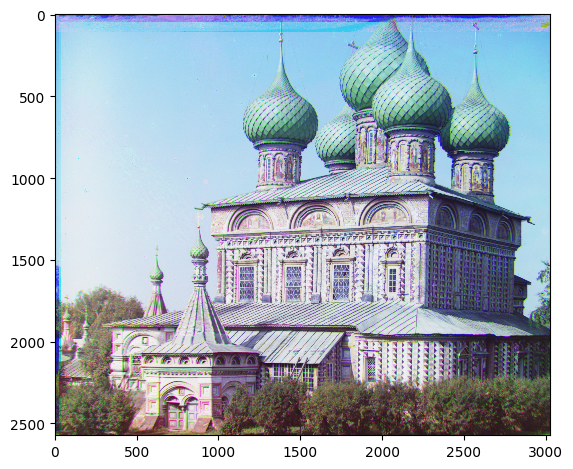

[51 26] [108  36]


In [222]:
image_path = "data/onion_church.tif"
output_dir = f"modifications/pyramid.jpg"
process(image_path, output_dir)

Processing emir.tif


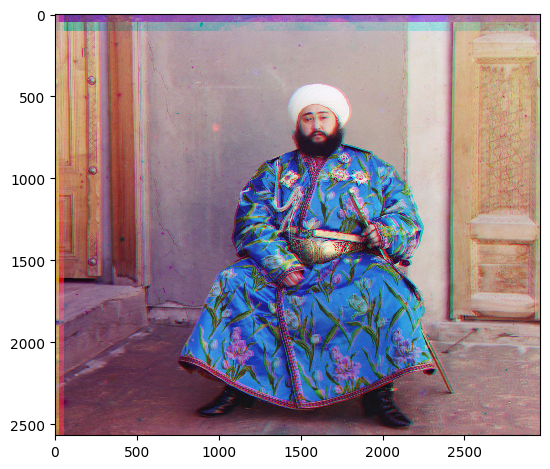

[49 24] [103  55]
Finished processing emir.tif
Processing monastery.jpg


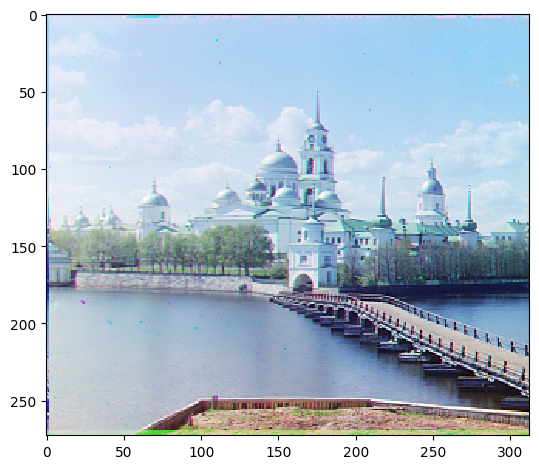

[-3  2] [3 2]
Finished processing monastery.jpg
Processing church.tif


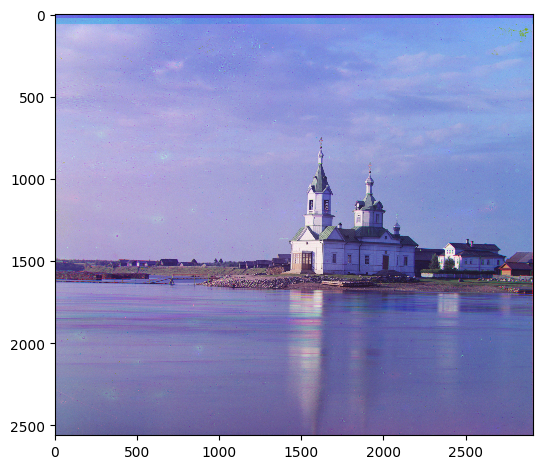

[25  4] [58 -4]
Finished processing church.tif
Processing three_generations.tif


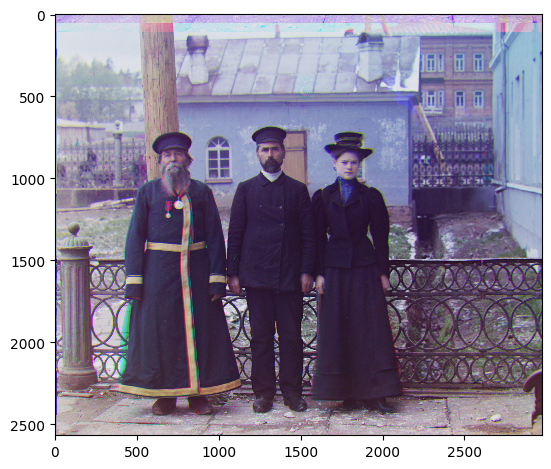

[53 14] [112  11]
Finished processing three_generations.tif
Processing melons.tif


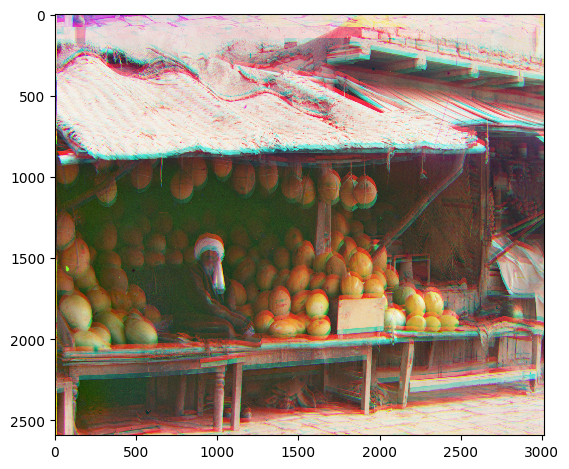

[81 10] [148  11]
Finished processing melons.tif
Processing onion_church.tif


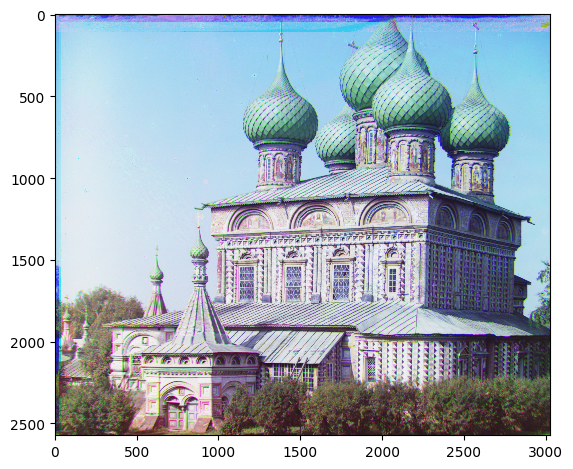

[51 26] [108  36]
Finished processing onion_church.tif
Processing train.tif


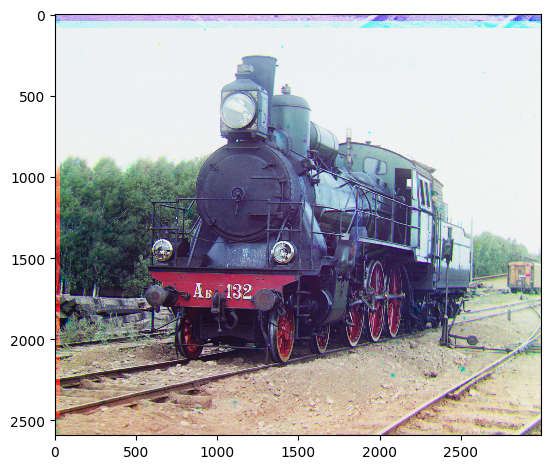

[42  5] [87 32]
Finished processing train.tif
Processing tobolsk.jpg


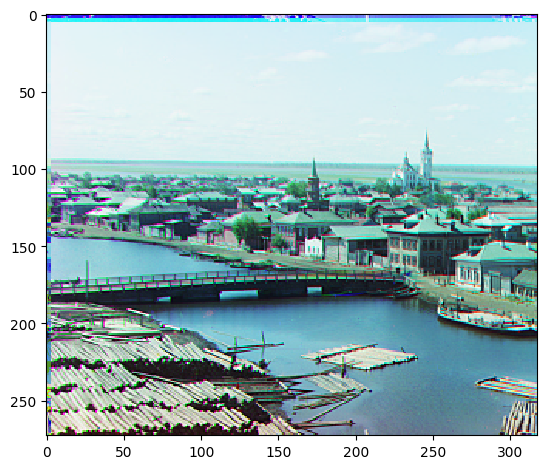

[3 3] [6 3]
Finished processing tobolsk.jpg
Processing icon.tif


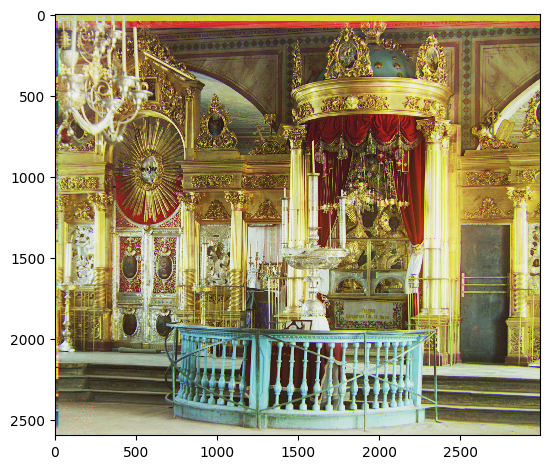

[41 17] [89 23]
Finished processing icon.tif
Processing cathedral.jpg


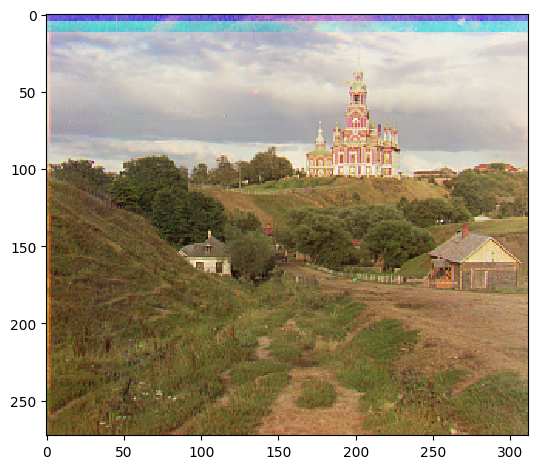

[5 2] [12  3]
Finished processing cathedral.jpg
Processing self_portrait.tif


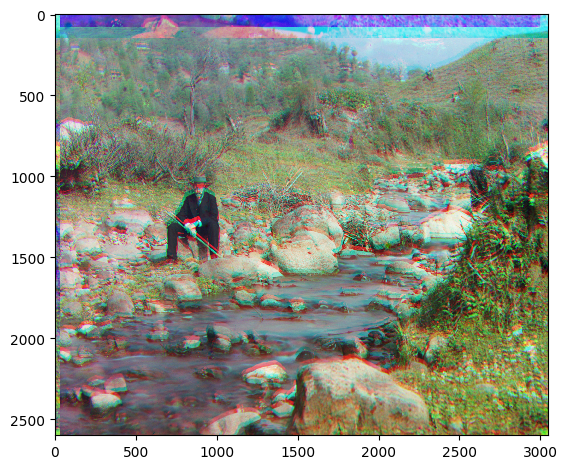

[78 29] [148  31]
Finished processing self_portrait.tif
Processing harvesters.tif


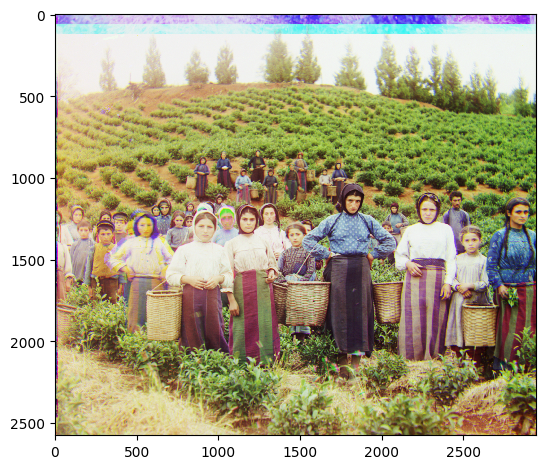

[59 16] [124  13]
Finished processing harvesters.tif
Processing sculpture.tif


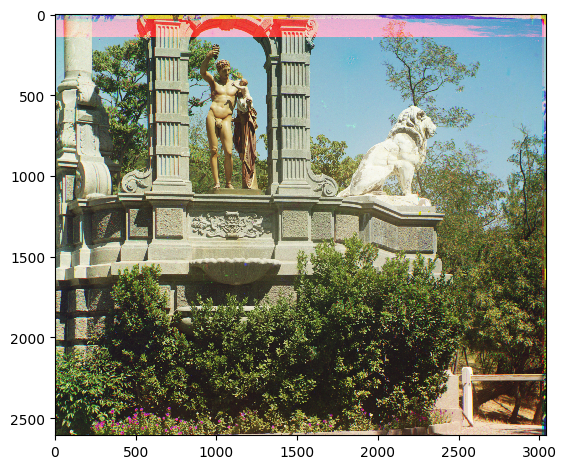

[ 33 -11] [140 -27]
Finished processing sculpture.tif
Processing lady.tif


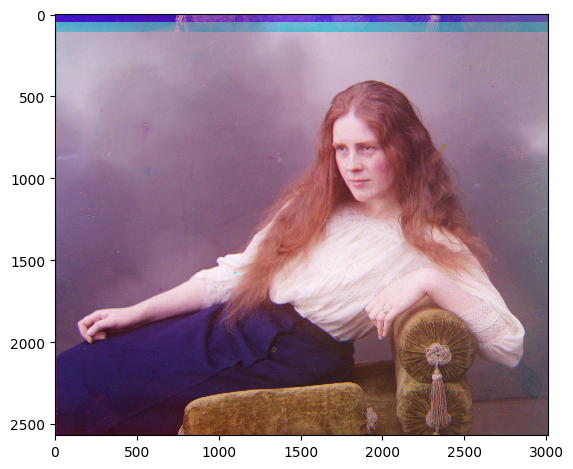

[51  9] [112  11]
Finished processing lady.tif


In [238]:
import os
for image_file in os.listdir("data"):
    image_path = os.path.join("data", image_file)
    if os.path.isfile(image_path) and image_file.lower().endswith(('.jpg', "tif")):
        print(f"Processing {image_file}")
        output_dir = f"output/{os.path.splitext(image_file)[0] + '_2.jpg'}"
        process(image_path, output_dir)
        print(f"Finished processing {image_file}")

In [236]:
def detect_borders(img, crop_percent=0.05):
    img = (img * 255).astype(np.uint8)
    edges = cv2.Canny(img, 100, 200)

    rows_with_edges = np.any(edges, axis=1)
    cols_with_edges = np.any(edges, axis=0)

    row_start = np.argmax(rows_with_edges)
    row_end = len(rows_with_edges) - np.argmax(np.flipud(rows_with_edges))
    col_start = np.argmax(cols_with_edges)
    col_end = len(cols_with_edges) - np.argmax(np.flipud(cols_with_edges))

    extra_row_crop = int((row_end - row_start) * crop_percent)
    extra_col_crop = int((col_end - col_start) * crop_percent)

    return row_start + extra_row_crop, row_end - extra_row_crop, col_start + extra_col_crop, col_end - extra_col_crop

def process_with_automatic_edge_detection(img_path, output_path):
    image = skio.imread(img_path)
    image = sk.img_as_float(image)
    height = image.shape[0] // 3

    b = image[:height]
    g = image[height:2*height]
    r = image[2*height:3*height]
    
    row_start_g, row_end_g, col_start_g, col_end_g = detect_borders(g)
    row_start_b, row_end_b, col_start_b, col_end_b = detect_borders(b)
    row_start_r, row_end_r, col_start_r, col_end_r = detect_borders(r)

    row_start = max(row_start_g, row_start_b, row_start_r)
    row_end = min(row_end_g, row_end_b, row_end_r)
    col_start = max(col_start_g, col_start_b, col_start_r)
    col_end = min(col_end_g, col_end_b, col_end_r)
    
    crop_g = g[row_start:row_end, col_start:col_end]
    crop_b = b[row_start:row_end, col_start:col_end]
    crop_r = r[row_start:row_end, col_start:col_end]

    aligned_g, shift1 = pyramid(crop_g, crop_b, l2_loss)
    aligned_r, shift2 = pyramid(crop_r, crop_b, l2_loss)

    print(shift1, shift2)
    
    combine_and_save_image(aligned_r, aligned_g, crop_b, output_path)

Processing emir.tif
[-148  148] [-148  148]


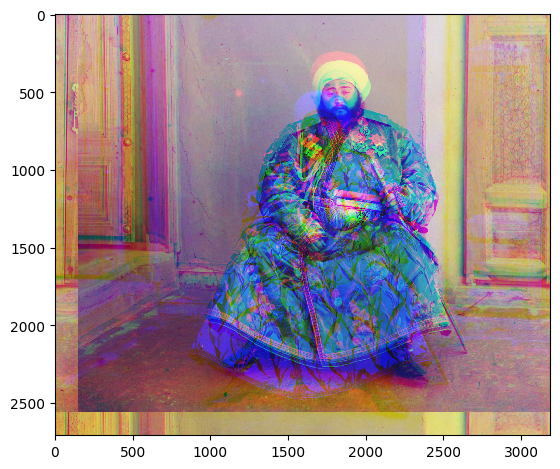

Finished processing emir.tif
Processing monastery.jpg
[ 15 -15] [-15  15]


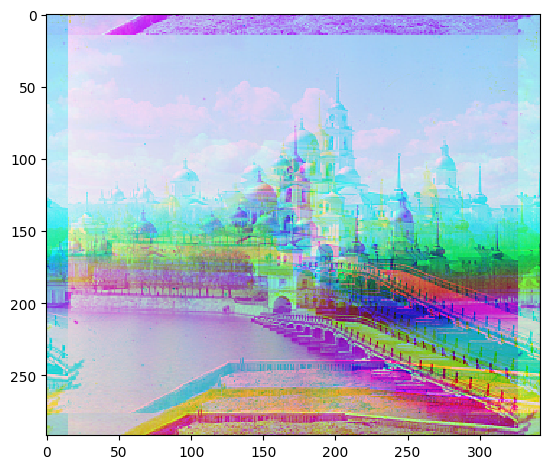

Finished processing monastery.jpg
Processing church.tif
[ 148 -148] [-148  148]


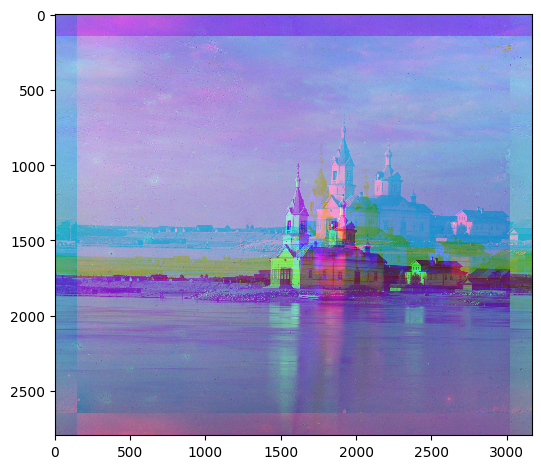

Finished processing church.tif
Processing three_generations.tif
[-148  148] [-148  148]


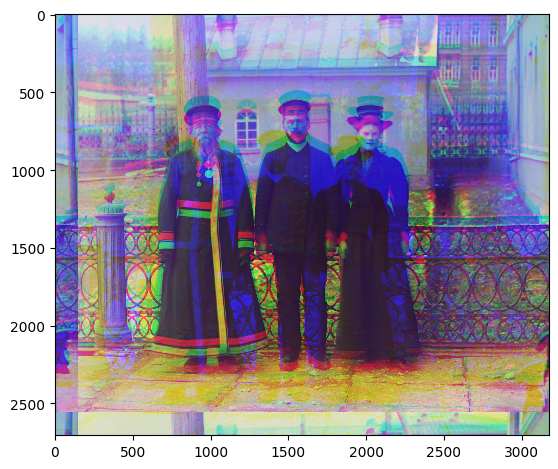

Finished processing three_generations.tif
Processing melons.tif
[-148  148] [-148  148]


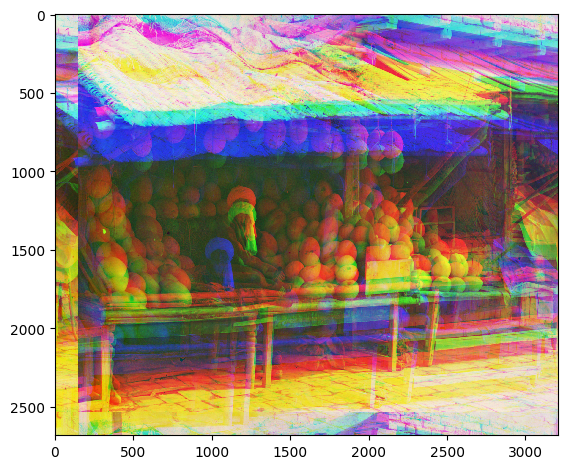

Finished processing melons.tif
Processing onion_church.tif
[-148 -148] [-148  148]


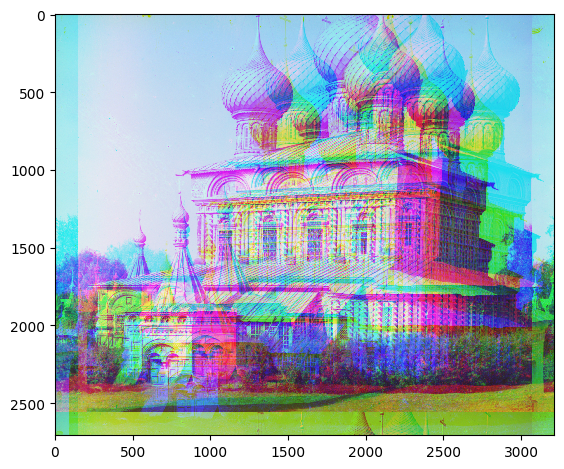

Finished processing onion_church.tif
Processing train.tif
[-148  148] [-148 -148]


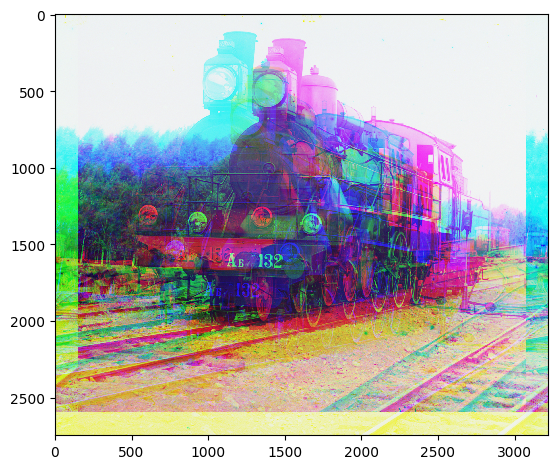

Finished processing train.tif
Processing tobolsk.jpg
[-15 -13] [-15 -13]


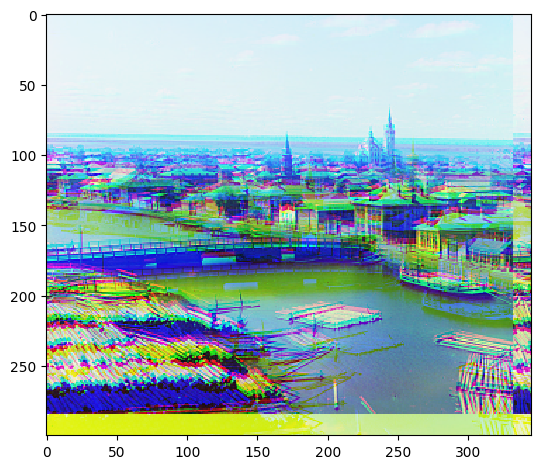

Finished processing tobolsk.jpg
Processing icon.tif
[-148 -148] [-148 -148]


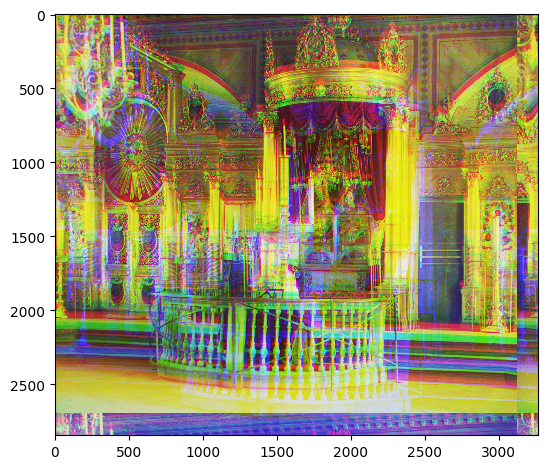

Finished processing icon.tif
Processing cathedral.jpg
[-15 -15] [-15 -15]


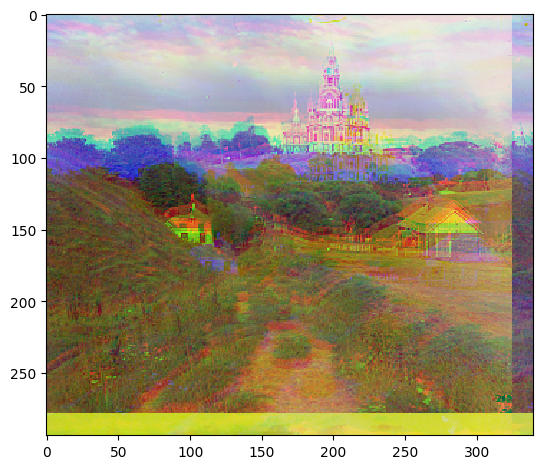

Finished processing cathedral.jpg
Processing self_portrait.tif
[-148 -148] [-148 -145]


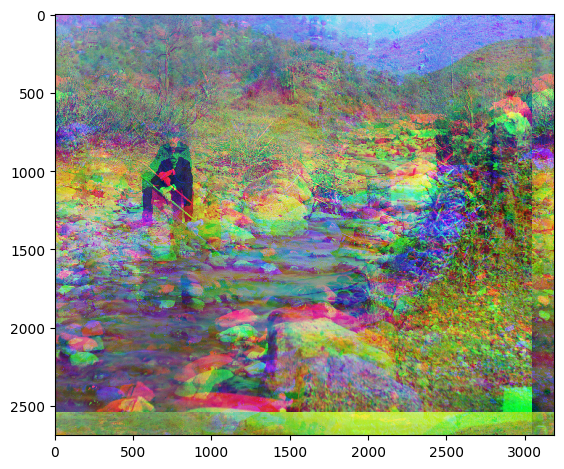

Finished processing self_portrait.tif
Processing harvesters.tif
[-148 -148] [-148 -148]


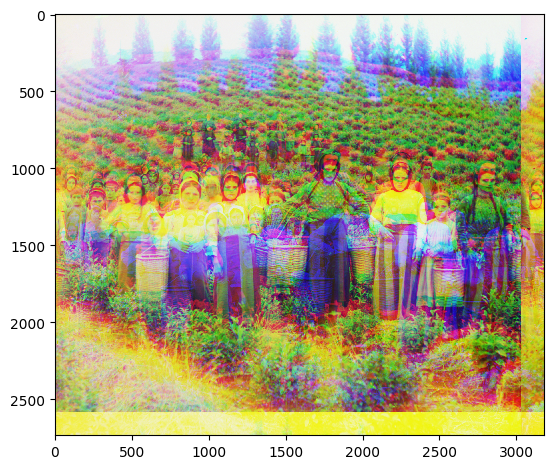

Finished processing harvesters.tif
Processing sculpture.tif
[-148 -148] [-148 -148]


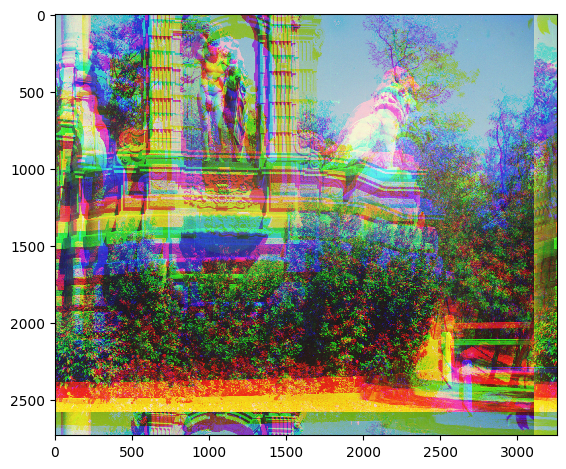

Finished processing sculpture.tif
Processing lady.tif
[-148  148] [-148  148]


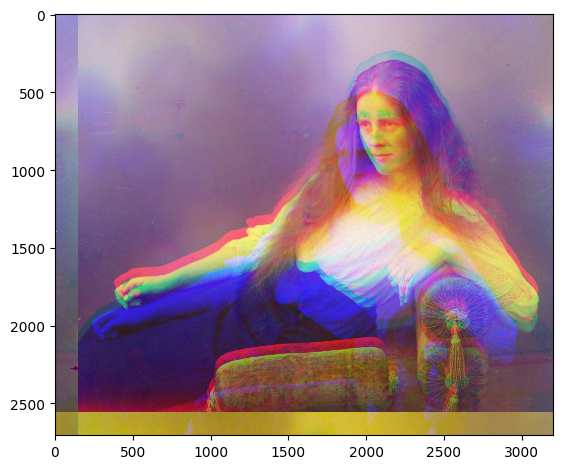

Finished processing lady.tif


In [237]:
import os
for image_file in os.listdir("data"):
    image_path = os.path.join("data", image_file)
    if os.path.isfile(image_path) and image_file.lower().endswith(('.jpg', "tif")):
        print(f"Processing {image_file}")
        output_dir = f"output/{os.path.splitext(image_file)[0] + '_cropped_detection.jpg'}"
        process_with_automatic_edge_detection(image_path, output_dir)
        print(f"Finished processing {image_file}")

In [223]:
def apply_sobel(img):
    sobel_kernel_x = np.array([[1, 0, -1],
                           [2, 0, -2],
                           [1, 0, -1]], dtype=np.float32)

    sobel_kernel_y = np.array([[1, 2, 1],
                               [ 0,  0,  0],
                               [ -1,  -2,  -1]], dtype=np.float32)
    edges_x = convolve(img, sobel_kernel_x)
    edges_y = convolve(img, sobel_kernel_y)

    edges = np.sqrt(edges_x ** 2 + edges_y ** 2)
    return edges

def edge_detection_loss(img1, img2):
    if img1.ndim == 3:
        img1 = np.mean(img1, axis=2)  
    if img2.ndim == 3:
        img2 = np.mean(img2, axis=2) 

    edges_img1 = apply_sobel(img1)
    edges_img2 = apply_sobel(img2)

    return l2_loss(edges_img1, edges_img2)    

In [224]:
def process_with_sobel_edges(img_path, output_path):
    image = skio.imread(img_path)
    image = sk.img_as_float(image)
    height = image.shape[0] // 3

    b = image[:height]
    g = image[height:2*height]
    r = image[2*height:3*height]
    
    crop_g, crop_b, crop_r = crop_edge(g), crop_edge(b), crop_edge(r)

    shifted_g, shift1= pyramid(crop_g, crop_b, edge_detection_loss)
    shifted_r, shift2 = pyramid(crop_r, crop_b, edge_detection_loss)

    print(shift1, shift2)

    combine_and_save_image(shifted_r, shifted_g, crop_b, output_path)

[-148  142] [-148  148]


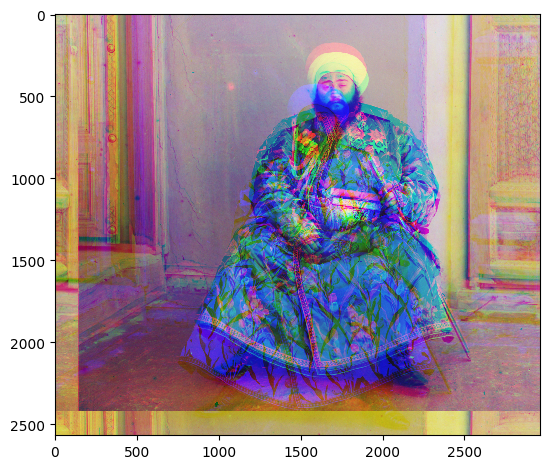

In [225]:
image_path = "data/emir.tif"
output_dir = f"modifications/sobel.jpg"
process_with_sobel_edges(image_path, output_dir)

In [235]:
def find_outlines(image_path):
    # Read the image
    image = skio.imread(image_path)
    image = sk.img_as_float(image)
    height = image.shape[0] // 3

    b = image[:height]
    g = image[height:2*height]
    r = image[2*height:3*height]

    sobel = apply_sobel(b)
    sobel_g = apply_sobel(g)
    sobel_r = apply_sobel(r)
    
    sobel_b = (255 * (sobel - sobel.min()) / (sobel.max() - sobel.min())).astype(np.uint8)
    sobel_g = (255 * (sobel_g - sobel_g.min()) / (sobel_g.max() - sobel_g.min())).astype(np.uint8)
    sobel_r = (255 * (sobel_r - sobel_r.min()) / (sobel_r.max() - sobel_r.min())).astype(np.uint8)
    skio.imsave("sobel_edges_b.jpg", sobel_b)
    skio.imsave("sobel_edges_g.jpg", sobel_g)
    skio.imsave("sobel_edges_r.jpg", sobel_r)

image_path = "data/emir.tif"
find_outlines(image_path)